# Complex Network HW3

### import useful libraries

In [175]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde

### helper functions

In [186]:
def plot_degree_distribution(degrees, title="Degree Distribution"):
    plt.hist(degrees, bins=100, color='skyblue', edgecolor='black', alpha=0.7)
    plt.title(title)
    plt.xlabel("Degree")
    plt.ylabel("Number of nodes")
    plt.show()

def get_top_items(dictionary, node_names, top_k=5):
    top_items = sorted(dictionary.items(), key=lambda x: x[1], reverse=True)[:top_k]
    for n, val in top_items:
        print(f"    {node_names.get(n,n)}: {val:.6f}")

def centralization(centrality_dict):
    n = len(centrality_dict)
    max_c = max(centrality_dict.values())
    return sum(max_c - v for v in centrality_dict.values()) / (n-1)

def calculate_metrics(G, node_names=None):
    if node_names is None:
        node_names = {}
    
    print(f"Graph is directed: {G.is_directed()}")
    print(f"1) Number Of Nodes: {G.number_of_nodes()}, Number Of Edges: {G.number_of_edges()}")
    
    # --- Degree ---
    if G.is_directed():
        in_degrees = np.array([d for _, d in G.in_degree()])
        out_degrees = np.array([d for _, d in G.out_degree()])
        total_degrees = in_degrees + out_degrees
        print(f"2a) Average In-Degree: {in_degrees.mean():.5f}")
        print(f"2b) Average Out-Degree: {out_degrees.mean():.5f}")
        print(f"2c) Average Total Degree: {total_degrees.mean():.5f}")
        degrees_for_distribution = total_degrees
    else:
        degrees = np.array([d for _, d in G.degree()])
        print(f"2) Average Degree: {degrees.mean():.5f}")
        degrees_for_distribution = degrees

    # --- Density ---
    print(f"3) Density: {nx.density(G):.7f}")
    
    # --- Connected Components ---
    if G.is_directed():
        if nx.is_strongly_connected(G):
            Gc = G
            print("4) Graph is strongly connected.")
        else:
            GCC_nodes = max(nx.strongly_connected_components(G), key=len)
            Gc = G.subgraph(GCC_nodes).copy()
            print(f"4) Graph is not strongly connected. Using largest SCC with {Gc.number_of_nodes()} nodes.")
    else:
        if nx.is_connected(G):
            Gc = G
            print("4) Graph is connected.")
        else:
            GCC_nodes = max(nx.connected_components(G), key=len)
            Gc = G.subgraph(GCC_nodes).copy()
            print(f"4) Graph is not connected. Using largest connected component with {Gc.number_of_nodes()} nodes.")
    
    # --- Diameter ---
    diameter = nx.diameter(Gc)
    print(f"   Diameter of considered component: {diameter}")
    
    # --- Clustering & Transitivity ---
    print(f"5) Average Clustering Coefficient: {nx.average_clustering(G):.5f}")
    print(f"6) Transitivity: {nx.transitivity(G):.4f}")
    
    # --- Average Shortest Path ---
    avg_shortest_path = nx.average_shortest_path_length(Gc)
    print(f"7) Average Shortest Path Length for considered component: {avg_shortest_path:.6f}")
    
    # --- Degree Distribution Plot ---
    print("8) Degree Distribution Plot")
    if nx.is_directed(G):
         plot_degree_distribution(in_degrees, "in-degree")
         plot_degree_distribution(out_degrees, "out-degree")
    plot_degree_distribution(degrees_for_distribution, "total-degree")
    
    # --- Assortativity ---
    if G.is_directed():
        assort_in = nx.degree_assortativity_coefficient(G, x='in', y='in')
        assort_out = nx.degree_assortativity_coefficient(G, x='out', y='out')
        print(f"9) Assortativity (in-in): {assort_in:.6f}")
        print(f"   Assortativity (out-out): {assort_out:.6f}")
    else:
        assort = nx.degree_assortativity_coefficient(G)
        print(f"9) Assortativity (degree correlation): {assort:.6f}")
    
    # --- Centrality ---
    if G.is_directed():
        degree_cent = nx.in_degree_centrality(G)
    else:
        degree_cent = nx.degree_centrality(G)
    betweenness_cent = nx.betweenness_centrality(Gc)
    closeness_cent = nx.closeness_centrality(Gc)
    pagerank_cent = nx.pagerank(G, alpha=0.85)
    
    print("\n10a) Top 5 nodes by Degree Centrality:")
    get_top_items(degree_cent, node_names)
    print("\n10b) Top 5 nodes by Betweenness Centrality:")
    get_top_items(betweenness_cent, node_names)
    print("\n10c) Top 5 nodes by Closeness Centrality:")
    get_top_items(closeness_cent, node_names)
    print("\n10d) Top 5 nodes by PageRank:")
    get_top_items(pagerank_cent, node_names)
    
    print("\n11) Network Centralization:")
    print(f"   Degree Centralization: {centralization(degree_cent):.6f}")
    print(f"   Betweenness Centralization: {centralization(betweenness_cent):.6f}")
    print(f"   Closeness Centralization: {centralization(closeness_cent):.6f}")
    print(f"   PageRank Centralization: {centralization(pagerank_cent):.6f}")

## 1. co-authorship dataset

In [177]:
EDGE_FILE = "data/hep-th.net"
NAMES_FILE = "data/hep-th_names.txt"

In [178]:
# read EDGE_FILE file
G = nx.read_edgelist(EDGE_FILE, nodetype=int)
node_names = {}
with open(NAMES_FILE, "r") as f:
    for line in f:
        node, name = line.strip().split(" ", 1)
        node_names[int(node)] = name
nx.set_node_attributes(G, node_names, "name")        

In [179]:
get_graph_base_information(G, node_names)

node names length: 8361
Is connected: False
LCC size: 5835


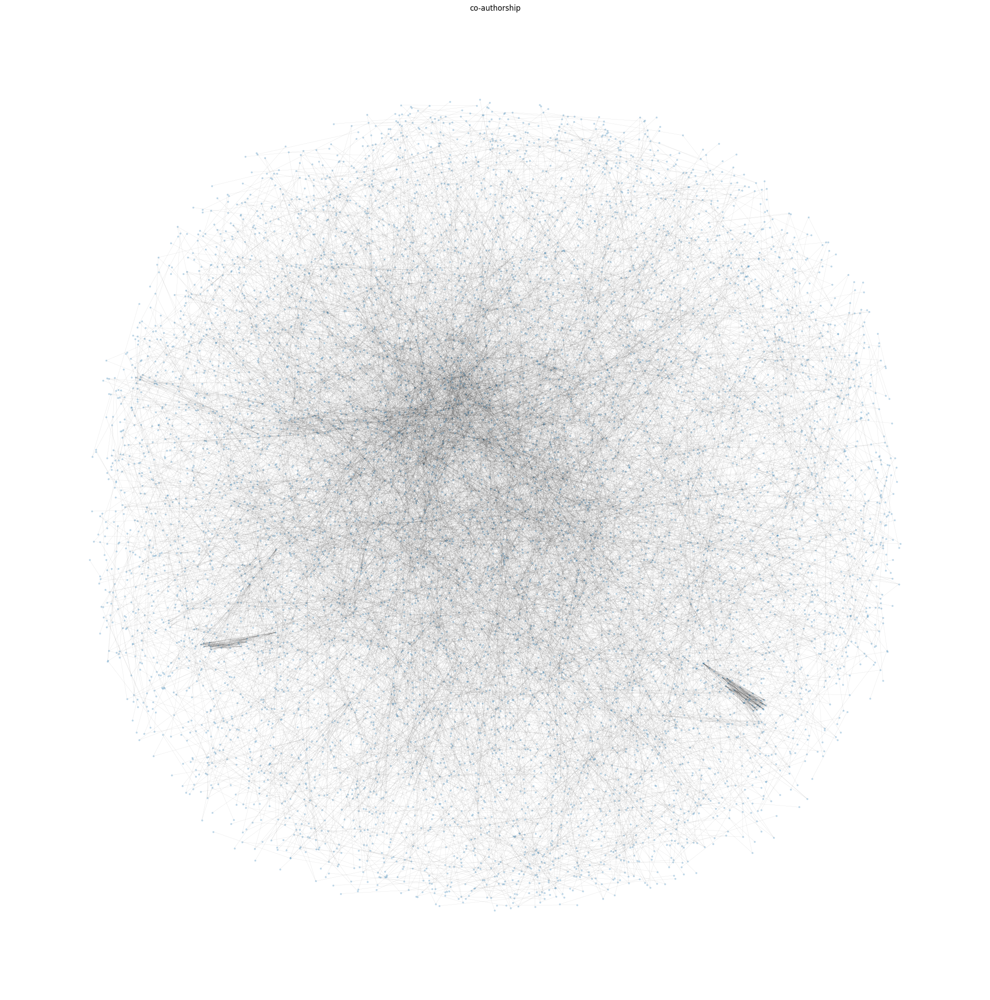

In [180]:
plot_graph(G, "co-authorship")

Graph is directed: False
1) Number Of Nodes: 7610, Number Of Edges: 15751
2) Average Degree: 4.13955
3) Density: 0.0005440
4) Graph is not connected. Using largest connected component with 5835 nodes.
   Diameter of considered component: 19
5) Average Clustering Coefficient: 0.48558
6) Transitivity: 0.3296
7) Average Shortest Path Length for considered component: 7.026388
8) Degree Distribution Plot


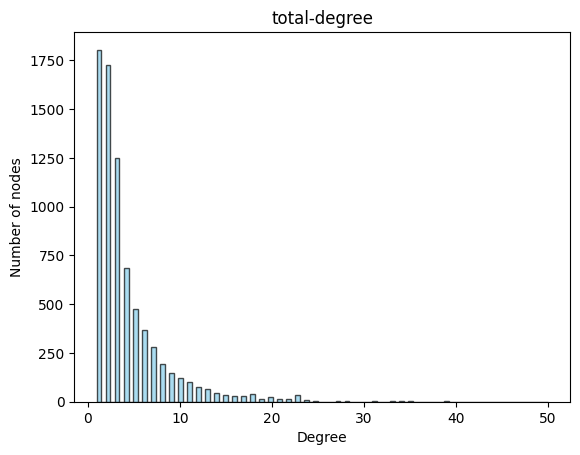

9) Assortativity (degree correlation): 0.293931

10a) Top 5 nodes by Degree Centrality:
    AMBJORN, J: 0.006571
    FERRARA, S: 0.005783
    VAFA, C: 0.005651
    ODINTSOV, SD: 0.005126
    KOGAN, II: 0.005126

10b) Top 5 nodes by Betweenness Centrality:
    ODINTSOV, SD: 0.041355
    AMBJORN, J: 0.038259
    KOGAN, II: 0.036143
    HENNEAUX, M: 0.034951
    DOUGLAS, MR: 0.029975

10c) Top 5 nodes by Closeness Centrality:
    VAFA, C: 0.213520
    FERRARA, S: 0.212710
    MYERS, RC: 0.209886
    DOUGLAS, MR: 0.209788
    TOWNSEND, PK: 0.209509

10d) Top 5 nodes by PageRank:
    AMBJORN, J: 0.001078
    ODINTSOV, SD: 0.000897
    KOGAN, II: 0.000841
    VAFA, C: 0.000757
    FERRARA, S: 0.000712

11) Network Centralization:
   Degree Centralization: 0.006028
   Betweenness Centralization: 0.040329
   Closeness Centralization: 0.067545
   PageRank Centralization: 0.000947


In [181]:
calculate_metrics(G, node_names)

## 2. Wiki-Vote dataset

In [187]:
FILE_PATH = "data/wiki.txt"

In [188]:
G = nx.DiGraph()

node_names = {}
with open(FILE_PATH, 'r') as f:
    for line in f:
        if line.startswith("#") or line.strip() == "":
            continue
        from_node, to_node = map(int, line.strip().split())
        node_names[int(from_node)] = f"node-{from_node}"
        node_names[int(to_node)] = f"node-{to_node}"
        G.add_edge(from_node, to_node)

print(f"Nodes: {G.number_of_nodes()}")
print(f"Edges: {G.number_of_edges()}")

Nodes: 7115
Edges: 103689


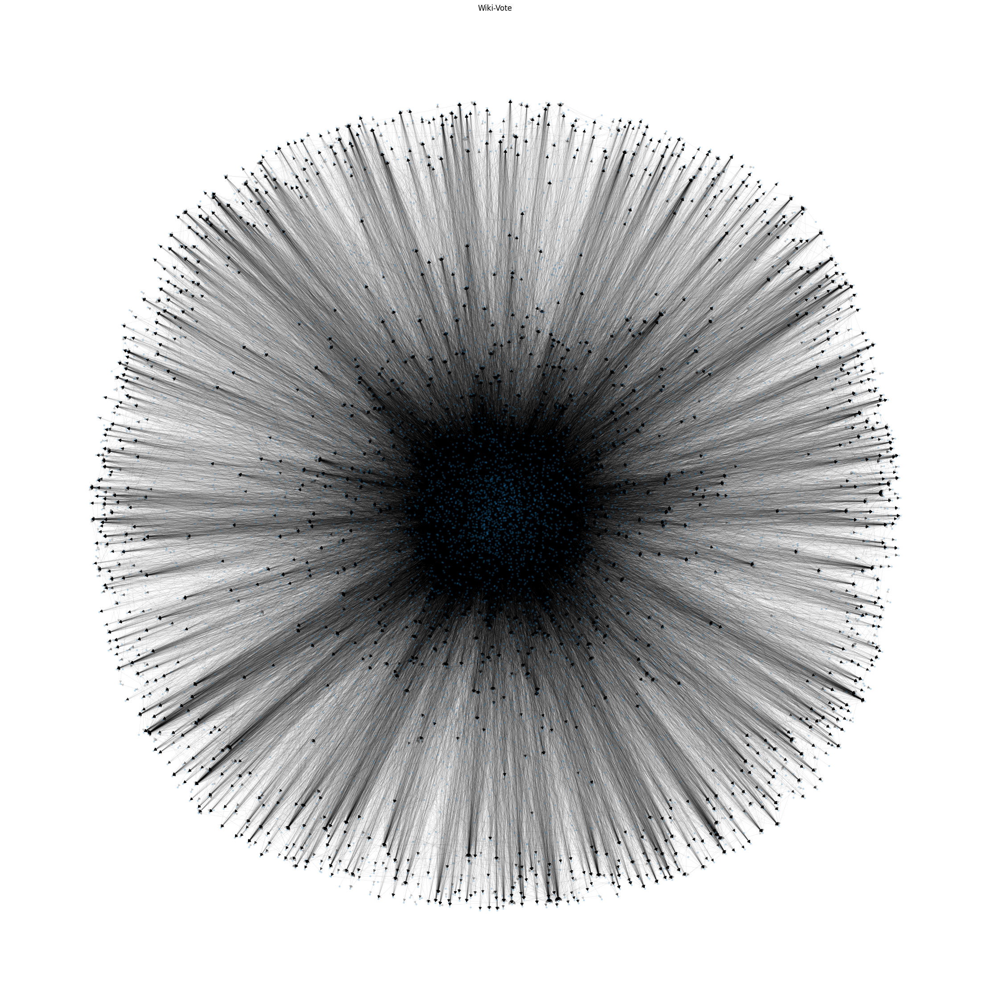

In [154]:
plot_graph(G, "Wiki-Vote")

Graph is directed: True
1) Number Of Nodes: 7115, Number Of Edges: 103689
2a) Average In-Degree: 14.57330
2b) Average Out-Degree: 14.57330
2c) Average Total Degree: 29.14659
3) Density: 0.0020485
4) Graph is not strongly connected. Using largest SCC with 1300 nodes.
   Diameter of considered component: 9
5) Average Clustering Coefficient: 0.08156
6) Transitivity: 0.0529
7) Average Shortest Path Length for considered component: 2.879283
8) Degree Distribution Plot


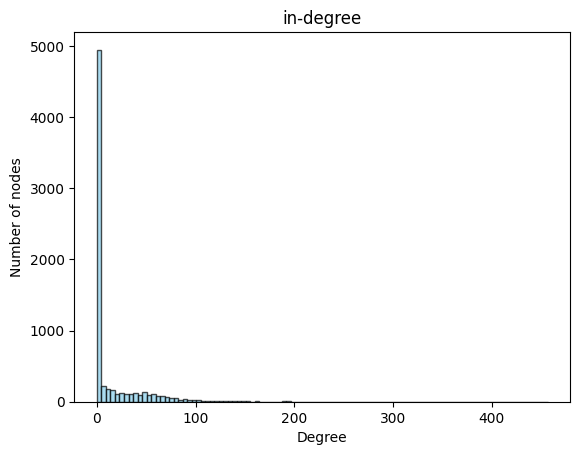

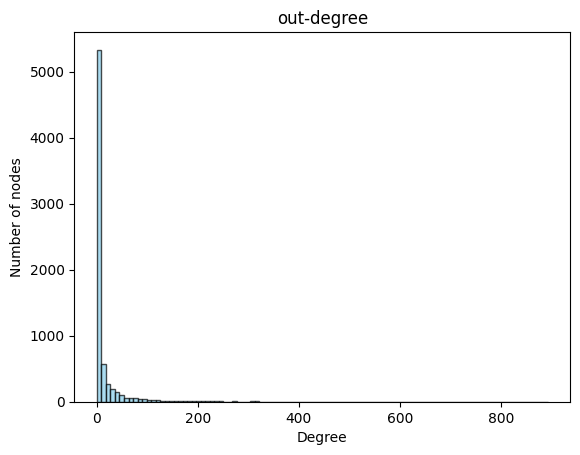

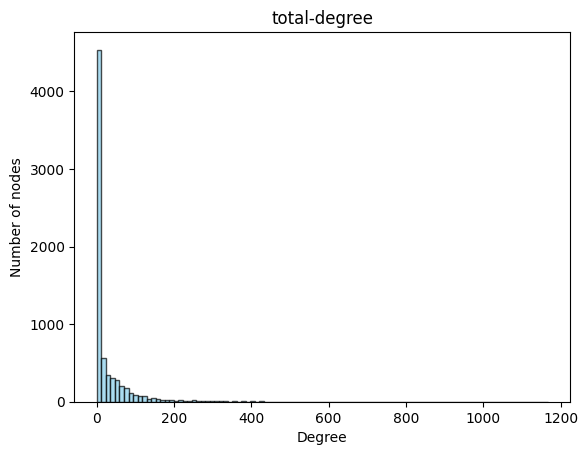

9) Assortativity (in-in): 0.005091
   Assortativity (out-out): -0.018909

10a) Top 5 nodes by Degree Centrality:
    node-4037: 0.064240
    node-15: 0.050745
    node-2398: 0.047793
    node-2625: 0.046528
    node-1297: 0.043435

10b) Top 5 nodes by Betweenness Centrality:
    node-2565: 0.073278
    node-1549: 0.072640
    node-15: 0.040834
    node-72: 0.037760
    node-1166: 0.024145

10c) Top 5 nodes by Closeness Centrality:
    node-4037: 0.469801
    node-2398: 0.468277
    node-15: 0.461785
    node-1549: 0.451983
    node-762: 0.449170

10d) Top 5 nodes by PageRank:
    node-4037: 0.004613
    node-15: 0.003681
    node-6634: 0.003525
    node-2625: 0.003286
    node-2398: 0.002605

11) Network Centralization:
   Degree Centralization: 0.062200
   Betweenness Centralization: 0.071886
   Closeness Centralization: 0.117929
   PageRank Centralization: 0.004473


In [189]:
calculate_metrics(G, node_names)

## 3) Large Scale Dataset

In [232]:
!pip install igraph


[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: pip install --upgrade pip


In [233]:
input_file = "data/com-youtube.ungraph.txt"
clean_file = "data/com-youtube.clean.txt"

with open(input_file, "r") as fin, open(clean_file, "w") as fout:
    for line in fin:
        if not line.startswith("#"):
            fout.write(line)

In [234]:
import igraph as ig
import time

t0 = time.time()

G = ig.Graph.Read_Edgelist(
    "data/com-youtube.clean.txt",
    directed=False
)

print("Graph loaded in", time.time() - t0, "seconds")

Graph loaded in 1.9061660766601562 seconds


In [235]:
G.simplify(multiple=True, loops=True)

In [236]:
n = G.vcount()
m = G.ecount()

print("1) #Nodes:", n)
print("   #Edges:", m)

1) #Nodes: 1157828
   #Edges: 2987624


In [237]:
avg_degree = 2 * m / n
print("2) Average Degree:", avg_degree)

2) Average Degree: 5.160738900769371


In [238]:
density = G.density()
print("3) Density:", density)

3) Density: 4.4572625277950605e-06


In [239]:
components = G.components()
giant = components.giant()

print("Giant Component:")
print("  Nodes:", giant.vcount())
print("  Edges:", giant.ecount())

Giant Component:
  Nodes: 1134890
  Edges: 2987624


In [240]:
import random

num_landmarks = 200  
landmarks = random.sample(range(giant.vcount()), num_landmarks)

In [242]:
approx_diameter = 0

for v in landmarks:
    dists = giant.distances(v)[0] 
    max_dist = max(d for d in dists if d < float('inf'))
    approx_diameter = max(approx_diameter, max_dist)

print("4) Approx Diameter:", approx_diameter)

4) Approx Diameter: 19


In [243]:
avg_clustering = giant.transitivity_avglocal_undirected(mode="zero")
print("5) Avg Clustering Coefficient:", avg_clustering)

5) Avg Clustering Coefficient: 0.08080227776188081


In [244]:
transitivity = giant.transitivity_undirected()
print("6) Transitivity:", transitivity)

6) Transitivity: 0.006218559818028638


In [246]:
n = giant.vcount()
k = 100

landmarks = random.sample(range(n), k)

In [247]:
total_dist = 0
reachable_pairs = 0

for v in landmarks:
    dists = giant.distances(v)[0]
    for d in dists:
        if d > 0 and d < float('inf'):
            total_dist += d
            reachable_pairs += 1

In [248]:
aspl_est = total_dist / reachable_pairs
print("7) Estimated Average Shortest Path Length:", aspl_est)

7) Estimated Average Shortest Path Length: 5.147131190803682


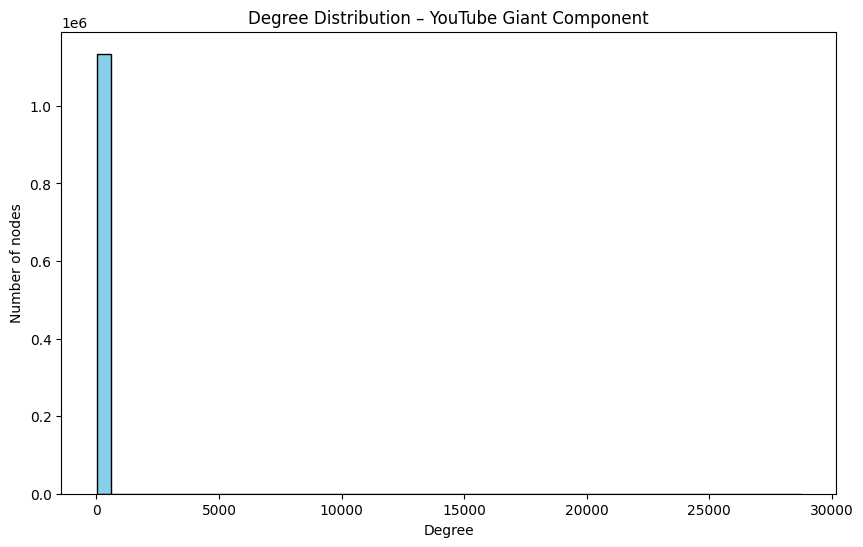

In [249]:
degrees = giant.degree()

plt.figure(figsize=(10,6))
plt.hist(degrees, bins=50, color='skyblue', edgecolor='black')
plt.xlabel("Degree")
plt.ylabel("Number of nodes")
plt.title("Degree Distribution – YouTube Giant Component")
plt.show()

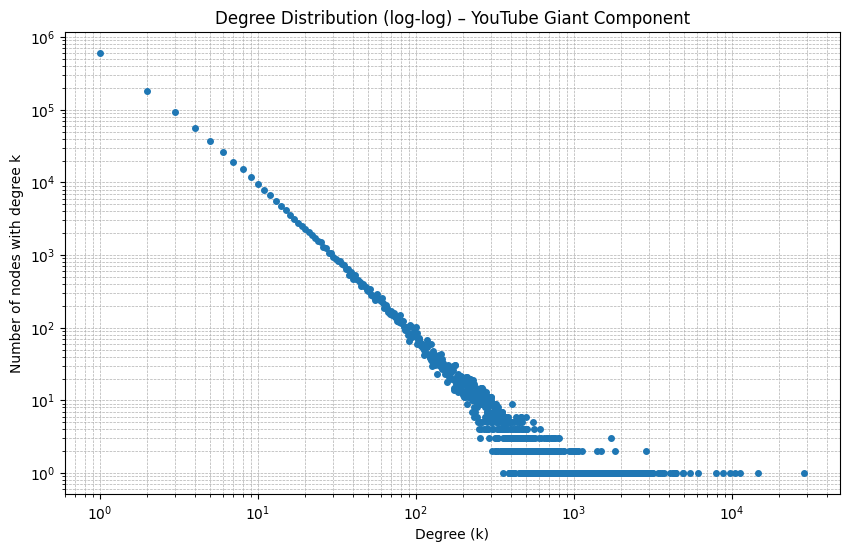

In [250]:
degrees = giant.degree()

degree_count = {}
for d in degrees:
    degree_count[d] = degree_count.get(d, 0) + 1

x = sorted(degree_count.keys())
y = [degree_count[k] for k in x]

plt.figure(figsize=(10,6))
plt.loglog(x, y, marker='o', linestyle='none', markersize=4)
plt.xlabel("Degree (k)")
plt.ylabel("Number of nodes with degree k")
plt.title("Degree Distribution (log-log) – YouTube Giant Component")
plt.grid(True, which="both", ls="--", linewidth=0.5)
plt.show()

In [251]:
assortativity = giant.assortativity_degree(directed=False)
print("9) Assortativity:", assortativity)

9) Assortativity: -0.036909908395276324


In [252]:
deg_cent = giant.degree()
top_deg = sorted(
    enumerate(deg_cent),
    key=lambda x: x[1],
    reverse=True
)[:5]

print("Top-5 Degree Centrality:", top_deg)

Top-5 Degree Centrality: [(1071, 28754), (362, 14641), (35660, 11281), (105, 10461), (482708, 9762)]


In [253]:
pr = giant.pagerank()
top_pr = sorted(
    enumerate(pr),
    key=lambda x: x[1],
    reverse=True
)[:5]

print("Top-5 PageRank:", top_pr)

Top-5 PageRank: [(1071, 0.003560565561626562), (35660, 0.0029652014276507514), (482708, 0.0018112353315719984), (362, 0.0017425543193098645), (105, 0.0016053065158564798)]


In [262]:
degrees = giant.degree()
max_deg = max(degrees)
n = giant.vcount()

degree_centralization = sum(max_deg - d for d in degrees) / ((n - 1) * (n - 2))
print("Degree Centralization:", degree_centralization)

Degree Centralization: 0.02533180391880757


In [263]:
pagerank = giant.pagerank(damping=0.85)
max_pr = max(pagerank)

pagerank_centralization = sum(max_pr - p for p in pagerank) / (n - 1)
print("PageRank Centralization:", pagerank_centralization)

PageRank Centralization: 0.0035596875555506872


In [ ]:
betw = giant.betweenness(cutoff=3)
max_b = max(betw)

betweenness_centralization = sum(max_b - b for b in betw) / ((n - 1) * (n - 2))
print("Betweenness Centralization (Approx):", betweenness_centralization)

In [ ]:
close = giant.closeness(cutoff=5)
max_c = max(close)

closeness_centralization = sum(max_c - c for c in close) / ((n - 2) / (2*n - 3))
print("Closeness Centralization (Approx):", closeness_centralization)